# Compare ref test run at CDP to lejeune2019 forcing (PSurf varying) simulation

In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)
import calendar
import os

In [2]:
path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowMIP/FR-Cdp_test/run_LJ19'
path2 = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowMIP/FR-Cdp_test/run_LJ19_PSurf'

label = 'run_LJ19'
# ds_yr = xr.open_mfdataset(path+'/*_annually.nc').load()
ds_mo = xr.open_mfdataset(path+'/*_monthly.nc').load()
ds_d = xr.open_mfdataset(path+'/*_daily.nc').load()
# ds_hh = xr.open_mfdataset(path+'/*_halfhourly.nc').load()

label2 = 'run_LJ19_PSurf'
ds2_mo = xr.open_mfdataset(path2+'/*_monthly.nc').load()
ds2_d = xr.open_mfdataset(path2+'/*_daily.nc').load()
# ds2_hh = xr.open_mfdataset(path2+'/*_halfhourly.nc').load()

Text(0.5, 0.98, 'Run Col de Porte (1995-2013)')

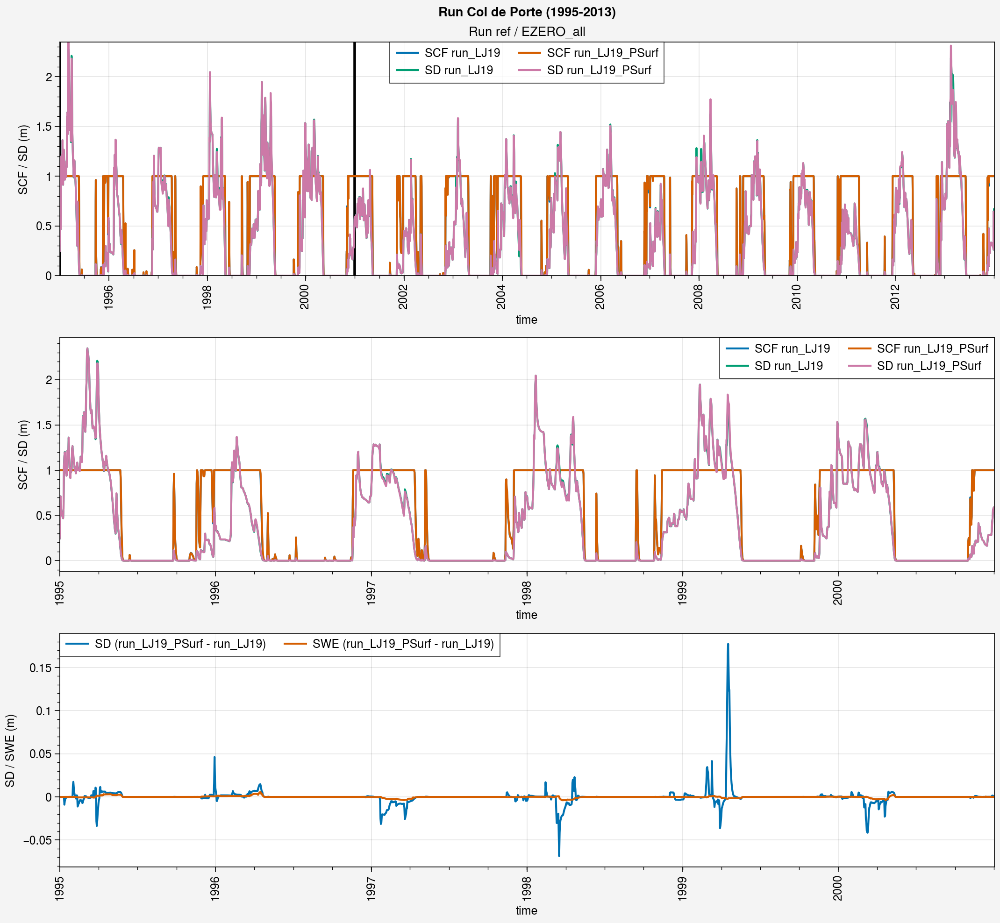

In [3]:
fig, axs = pplt.subplots(ncols=1, nrows=3, refaspect=4, refwidth=10, share=0)

##################
### All period ###
##################
start = '1995'
end = '2013'

axs[0].plot(ds_d.snc.sel(time=slice(start,end)).squeeze(), label='SCF '+label)
axs[0].plot(ds2_d.snc.sel(time=slice(start,end)).squeeze(), label='SCF '+label2)
axs[0].plot(ds_d.snd.sel(time=slice(start,end)).squeeze(), label='SD '+label)
axs[0].plot(ds2_d.snd.sel(time=slice(start,end)).squeeze(), label='SD '+label2)

axs[0].legend(ncols=2)
axs[0].format(
    title='Run ref / EZERO_all',
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = '1995'
end = '2000'

axs[1].plot(ds_d.snc.sel(time=slice(start,end)).squeeze(), label='SCF '+label)
axs[1].plot(ds2_d.snc.sel(time=slice(start,end)).squeeze(), label='SCF '+label2)
axs[1].plot(ds_d.snd.sel(time=slice(start,end)).squeeze(), label='SD '+label)
axs[1].plot(ds2_d.snd.sel(time=slice(start,end)).squeeze(), label='SD '+label2)
axs[0].vlines(ds_d.sel(time=slice(start,end)).time[0], ds_d.snd.min(), ds_d.snd.max(), color='k', lw=2)
axs[0].vlines(ds_d.sel(time=slice(start,end)).time[-1], ds_d.snd.min(), ds_d.snd.max(), color='k', lw=2)

axs[1].legend(ncols=2)
axs[1].format(
    ylabel='SCF / SD (m)'
)

#####################
### SWE / SD diff ###
#####################
axs[2].plot((ds2_d-ds_d).snd.sel(time=slice(start,end)).squeeze(), label='SD ('+label2+' - '+label+')')
axs[2].plot(((ds2_d-ds_d).snw*1e-3).sel(time=slice(start,end)).squeeze(), label='SWE ('+label2+' - '+label+')')

axs[2].legend(ncols=2)
axs[2].format(
    ylabel='SD / SWE (m)'
)

fig.suptitle('Run Col de Porte (1995-2013)')


## Compare with obs

In [4]:
path_menard2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
path_lejeune2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/CRYOBSCLIM_CDP'

ds_h_eval_menard2019 = xr.open_dataset(path_menard2019+'/obs_insitu_cdp_1994_2014.nc').load()
ds_d_eval_menard2019 = ds_h_eval_menard2019.resample(time='D').mean().load()
ds_h_eval_menard2019

<xarray.Dataset>
Dimensions:   (time: 175320, sdepth: 3)
Coordinates:
  * time      (time) datetime64[ns] 1994-10-01T01:00:00 ... 2014-10-01
  * sdepth    (sdepth) float32 0.1 0.2 0.5
Data variables:
    albs      (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snd_auto  (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snd_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snw_auto  (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snw_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    ts        (time) float32 11.12 9.668 8.029 0.9937 ... 7.532 7.532 8.029
    tsl       (time, sdepth) float32 11.95 12.28 12.23 11.8 ... 12.95 12.83 12.8

In [5]:
ds_h_eval_lejeune2019 = xr.open_dataset(path_lejeune2019+'/CRYOBSCLIM.CDP.2018.HourlySnow.nc').load()
# ds_d_eval_lejeune2019 = xr.open_dataset(path_lejeune2019+'/CRYOBSCLIM.CDP.2018.MetSnowDaily.nc')
ds_d_eval_lejeune2019 = ds_h_eval_lejeune2019.resample(time='D').mean().load()
ds_h_eval_lejeune2019

<xarray.Dataset>
Dimensions:                   (time: 254208)
Coordinates:
  * time                      (time) datetime64[ns] 1993-08-01 ... 2022-07-31...
Data variables: (12/70)
    Soil_temperature_10cm     (time) float64 289.9 289.7 289.5 ... 292.2 291.9
    Soil_temperature_20cm     (time) float64 290.1 290.0 289.9 ... 291.6 291.6
    Soil_temperature_50cm     (time) float64 288.6 288.6 288.7 ... 290.1 290.2
    Runoff_5m2                (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Runoff_1m2                (time) float64 0.2 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Snow_depth                (time) float64 nan nan nan nan ... 0.0 0.0 0.0 0.0
    ...                        ...
    Soil_moisture_10cm_2      (time) float64 nan nan nan ... 0.1284 0.128 0.1279
    Soil_moisture_10cm_3      (time) float64 nan nan nan ... 0.0606 0.0624
    Soil_moisture_20cm_1      (time) float64 nan nan nan ... 0.2251 0.2251 0.225
    Soil_moisture_20cm_2      (time) float64 nan nan nan ... 0.2104 0.2102 0.21
    Soil_moisture_30cm_1      (time) float64 nan nan nan ... 0.2498 0.2497
    Soil_moisture_30cm_2      (time) float64 nan nan nan ... 0.2918 0.2915
Attributes:
    history:  Thu Feb  9 11:25:20 2023: ncrcat CDP_hourly_19930801_20170731.n...
    NCO:      netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, C...

### SD

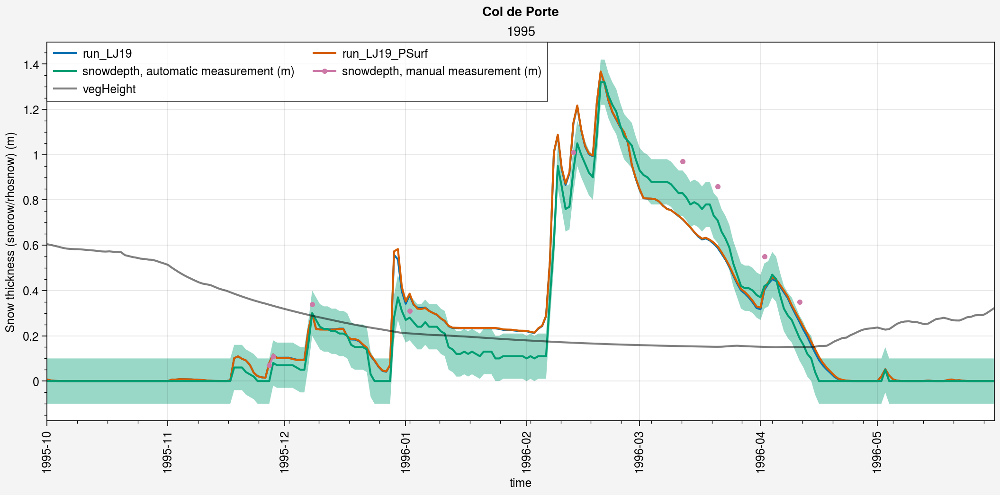

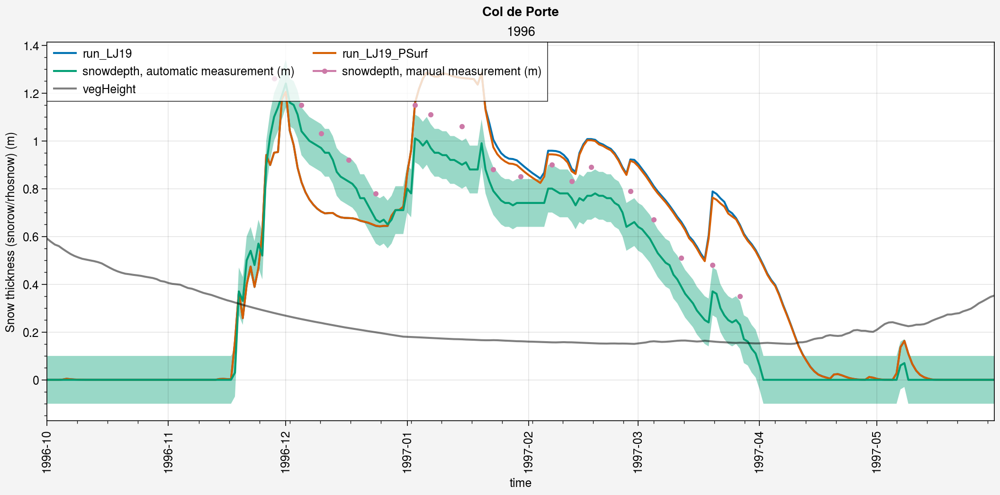

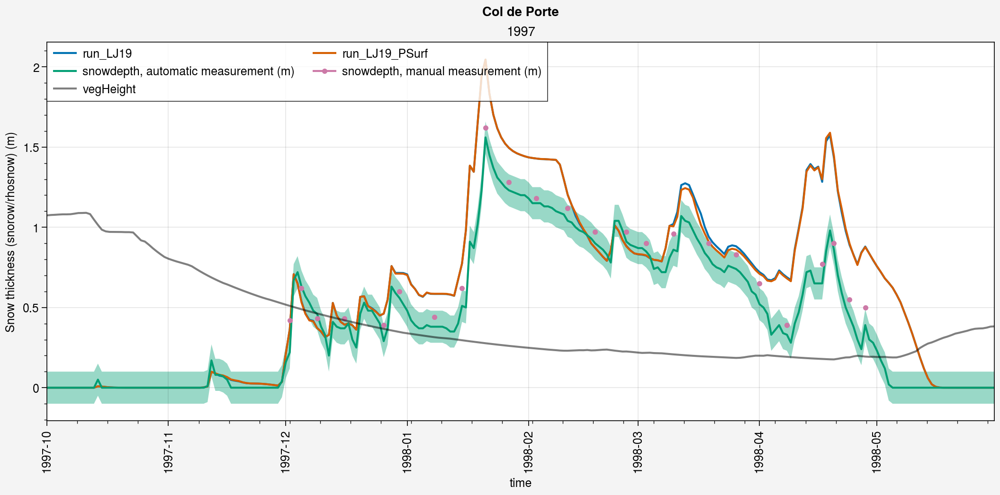

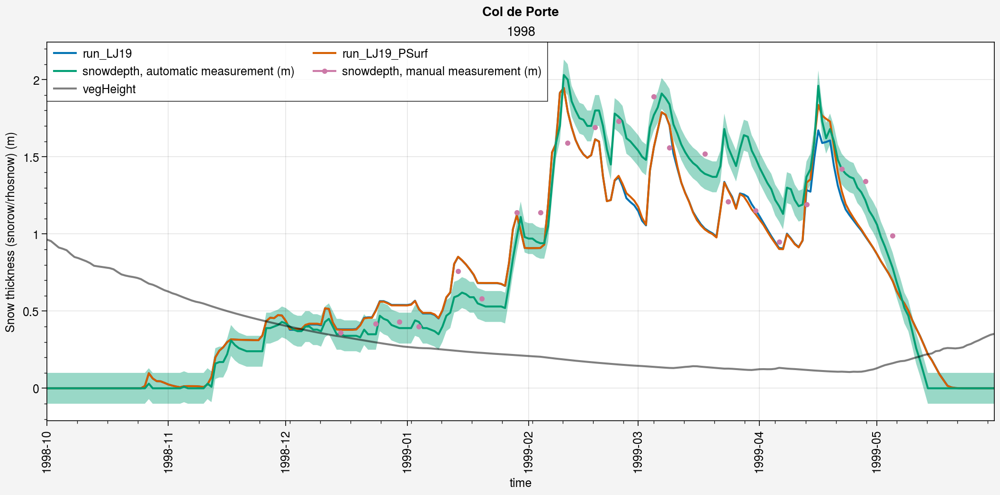

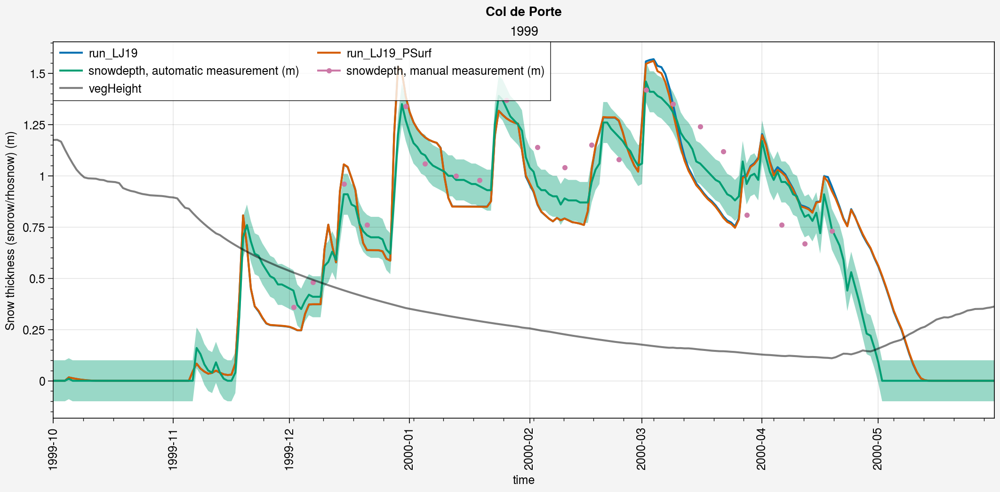

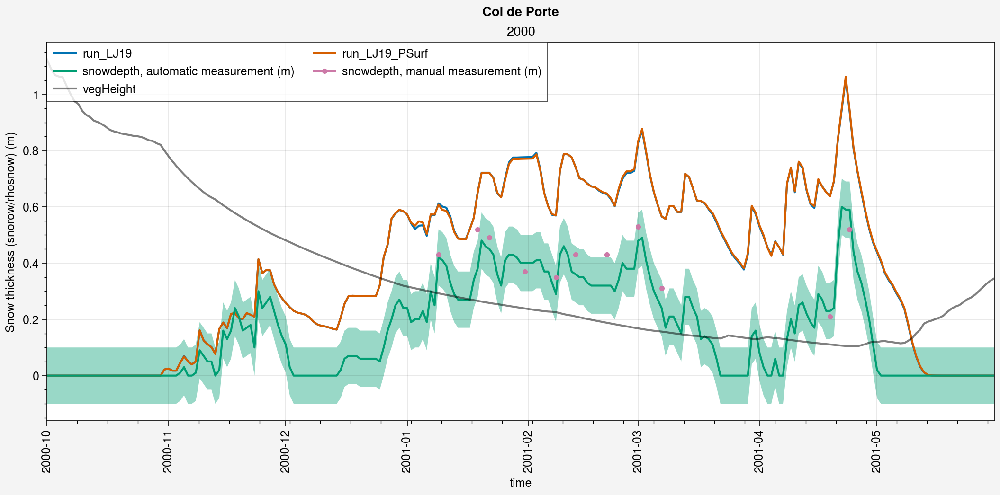

In [6]:
%matplotlib inline
# for year in pplt.arange(1995, 2012):
# for year in pplt.arange(1995, 1995):
for year in pplt.arange(1995, 2000):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(ds_d.snd.sel(time=period).squeeze(), label=label)
    axs[0].plot(ds2_d.snd.sel(time=period).squeeze(), label=label2)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata)
    axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.')

    # Veg
    axs[0].plot(ds2_d.vegHeight.sel(time=period).squeeze(), label='vegHeight', color='k', alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year))
    
    fig.suptitle('Col de Porte')


### SWE

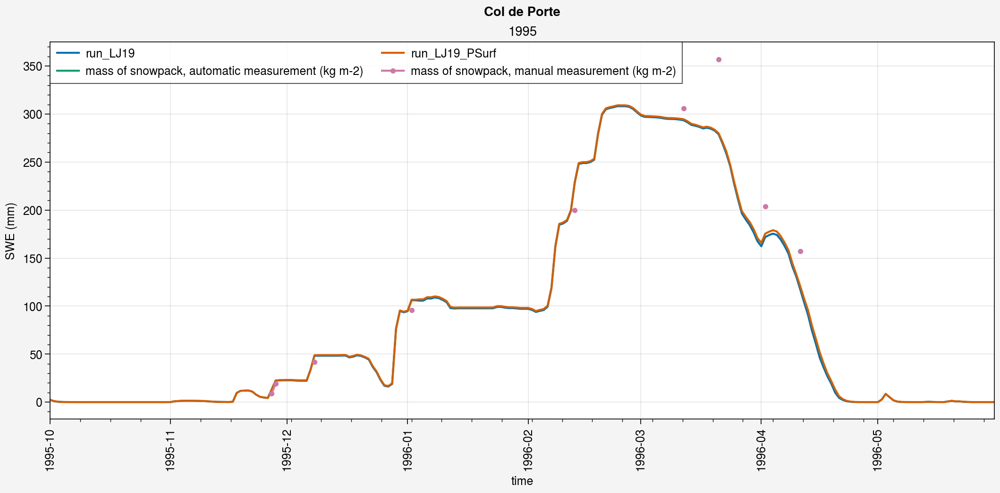

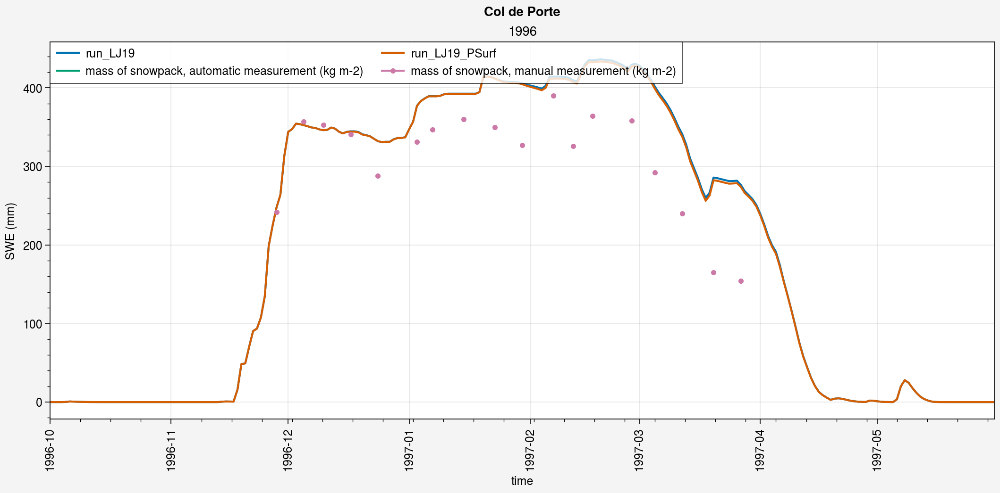

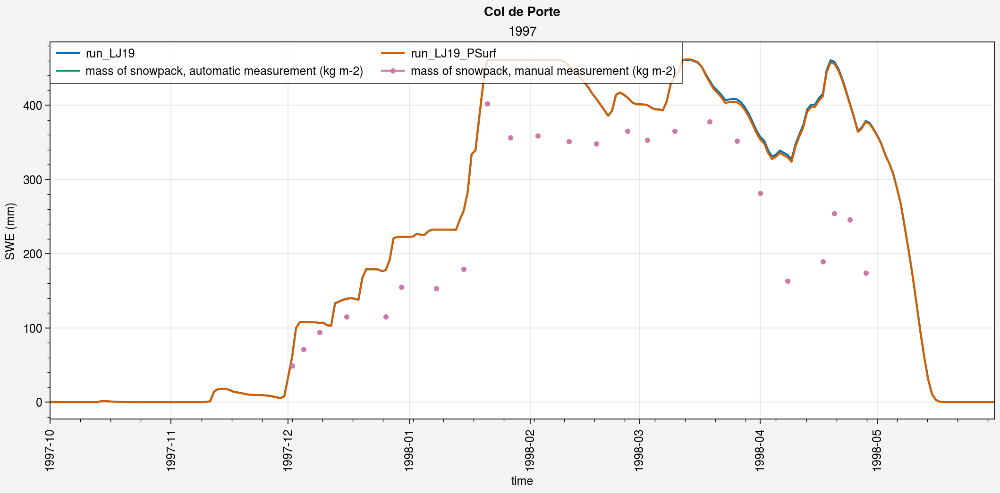

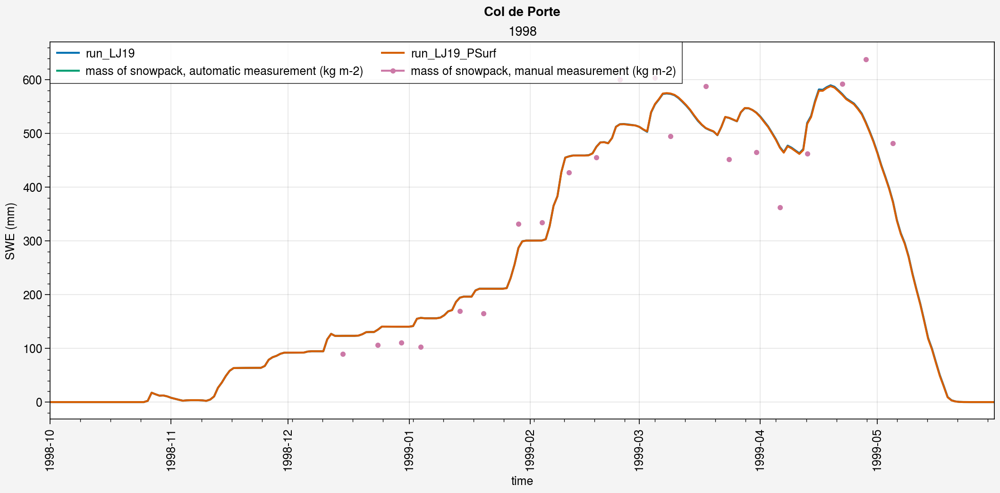

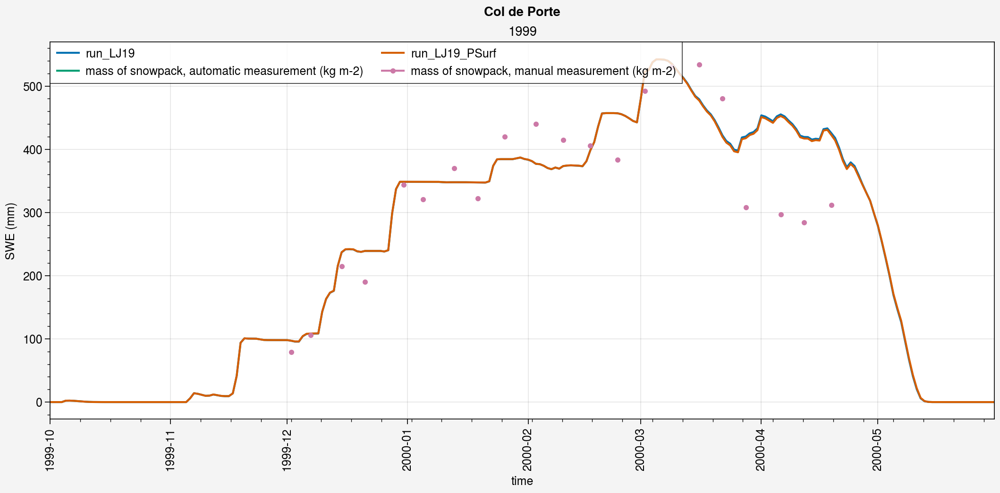

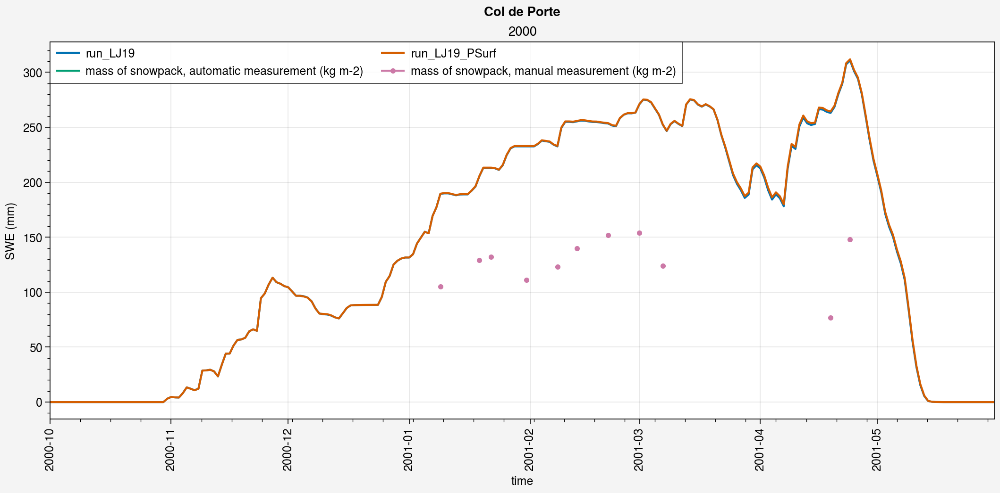

In [7]:
%matplotlib inline
# for year in pplt.arange(1995, 2012):
for year in pplt.arange(1995, 2000):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(ds_d.snw.sel(time=period).squeeze(), label=label)
    axs[0].plot(ds2_d.snw.sel(time=period).squeeze(), label=label2)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
        np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata)
    axs[0].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year), ylabel='SWE (mm)')
    
    fig.suptitle('Col de Porte')


### Albedo

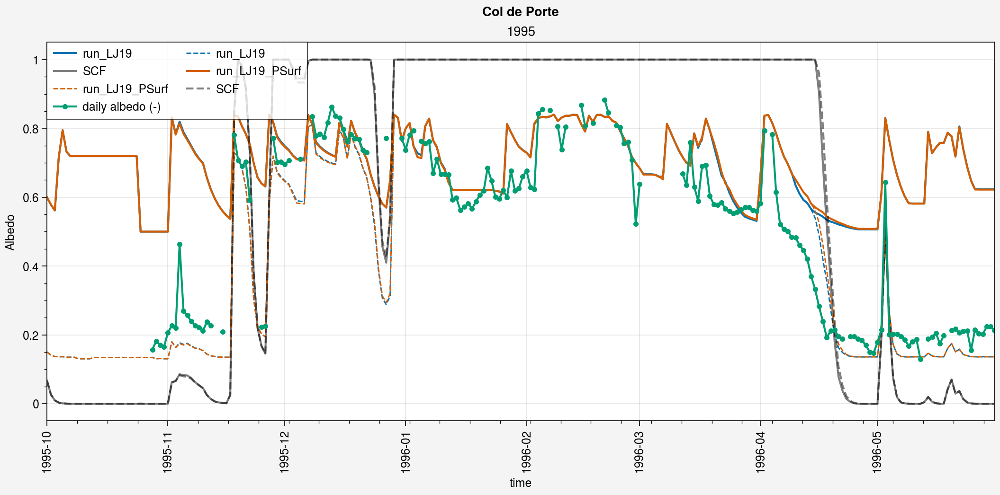

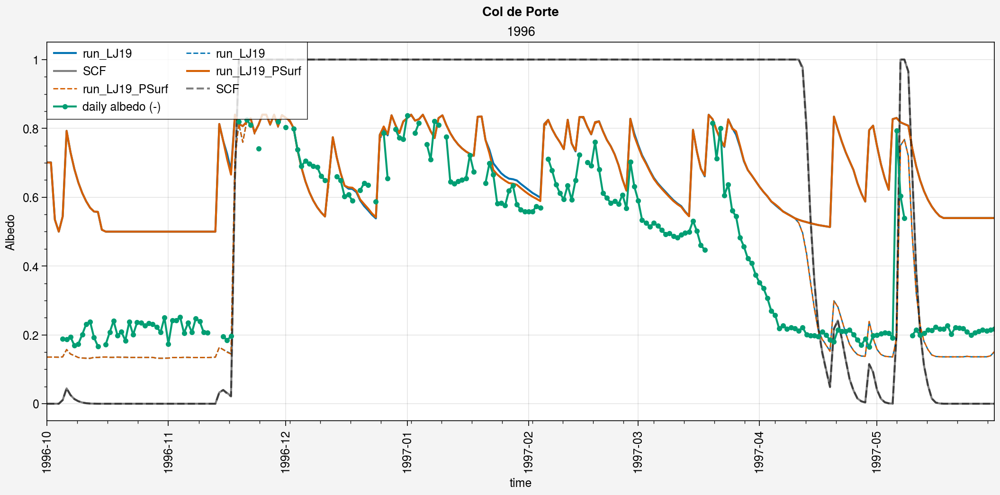

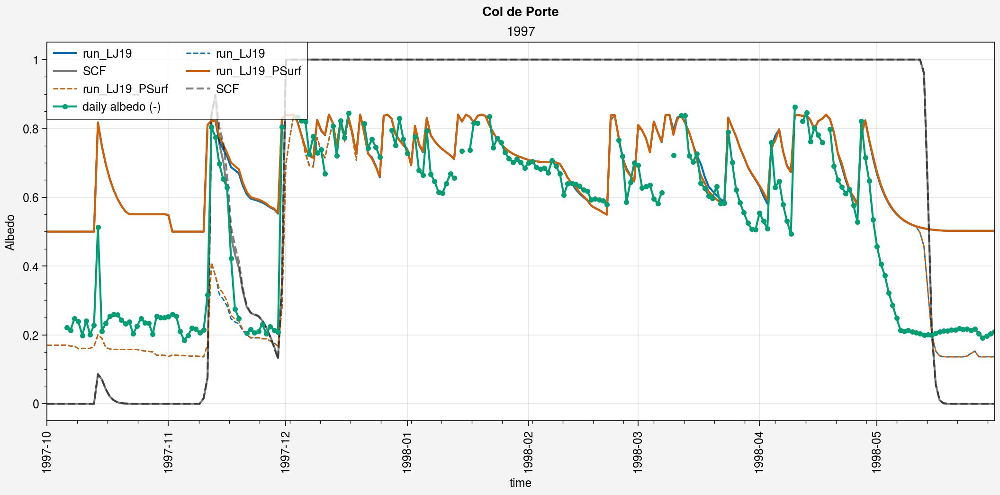

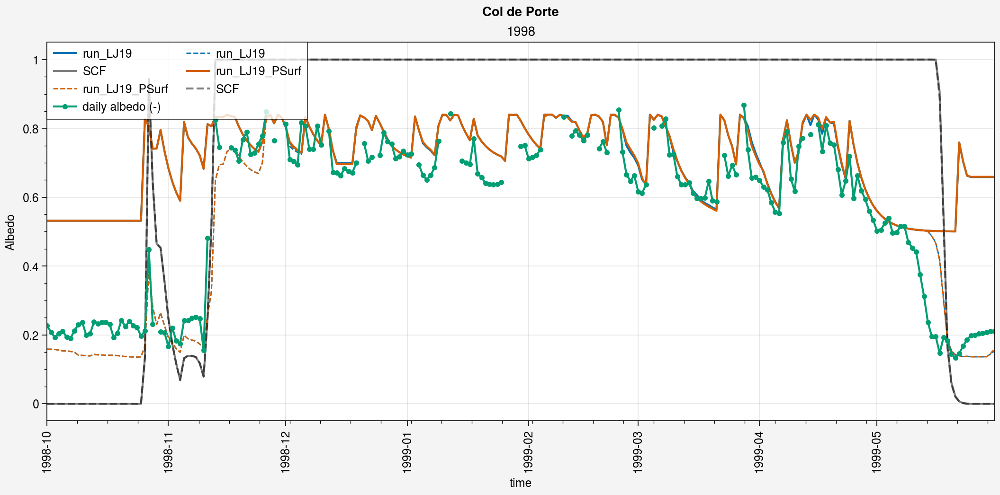

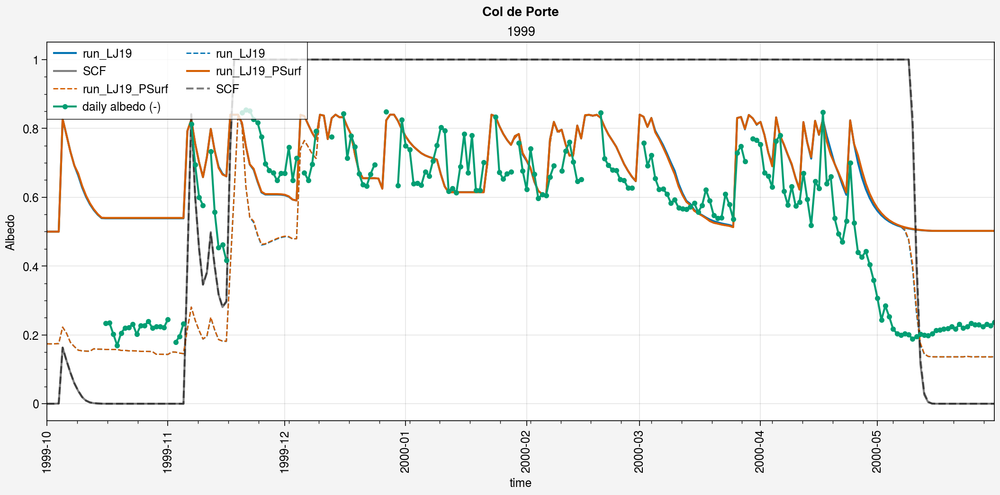

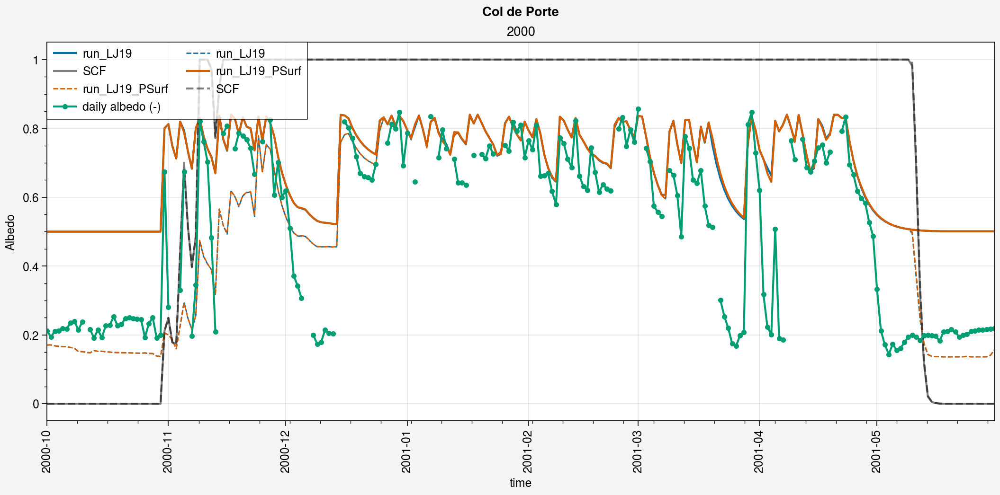

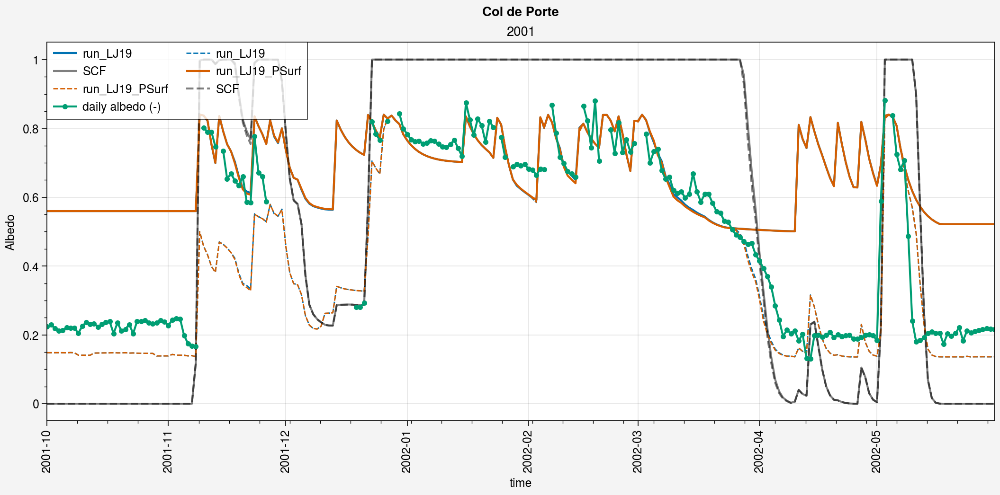

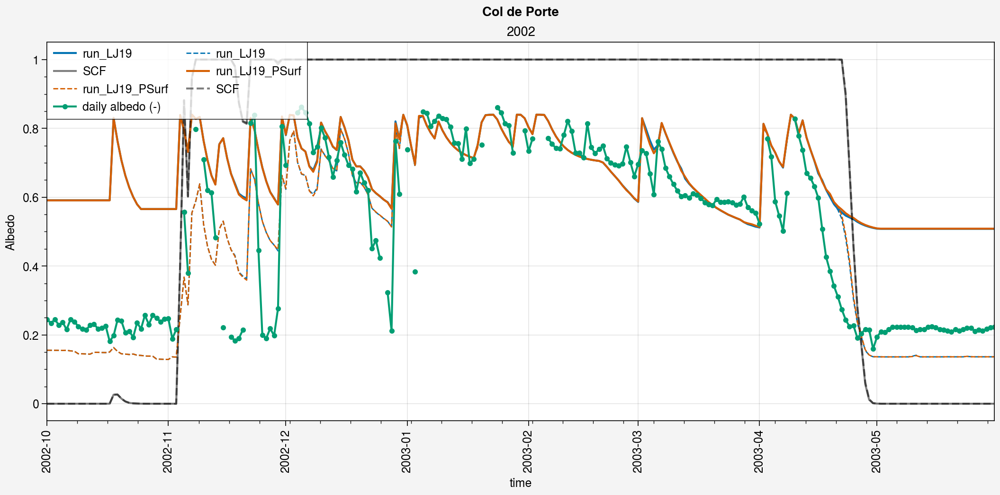

In [8]:
%matplotlib inline
# for year in pplt.arange(1995, 1995):
# for year in pplt.arange(1995, 2012):
for year in pplt.arange(1995, 2002):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(ds_d.albsn.sel(time=period).squeeze(), label=label, color='C0')
    axs[0].plot(ds_d.albs.sel(time=period).squeeze(), label=label, color='C0', ls='--', lw=1)
    axs[0].plot(ds_d.snc.sel(time=period).squeeze(), label='SCF', color='k', alpha=0.5)
    axs[0].plot(ds2_d.albsn.sel(time=period).squeeze(), label=label2, color='C1')
    axs[0].plot(ds2_d.albs.sel(time=period).squeeze(), label=label2, color='C1', ls='--', lw=1)
    axs[0].plot(ds2_d.snc.sel(time=period).squeeze(), label='SCF', color='k', alpha=0.5, ls='--')
    
    # Obs
    axs[0].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color='C2')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year), ylabel='Albedo')
    
    fig.suptitle('Col de Porte')


### Surface Temperature

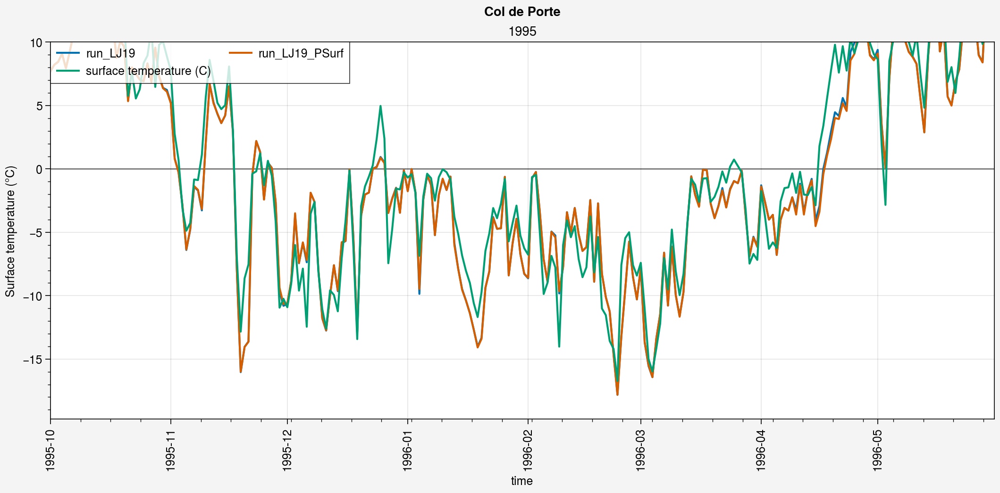

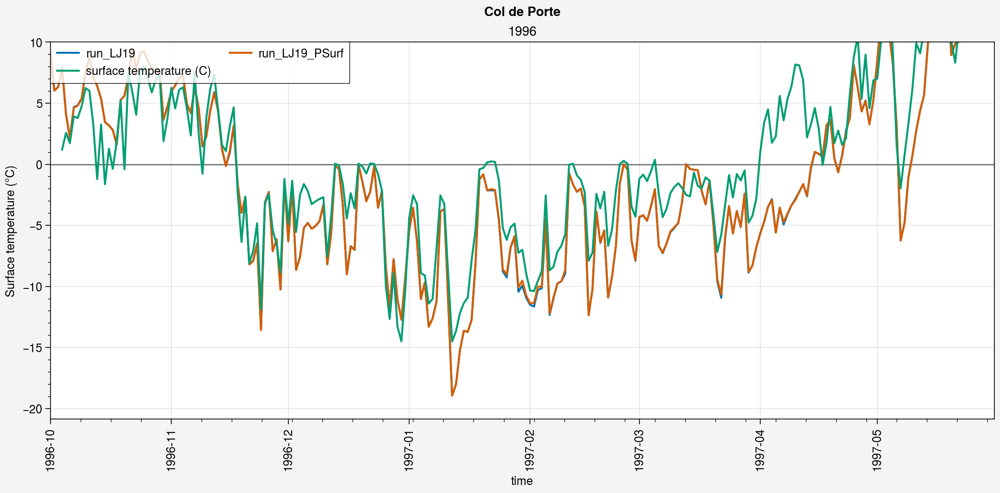

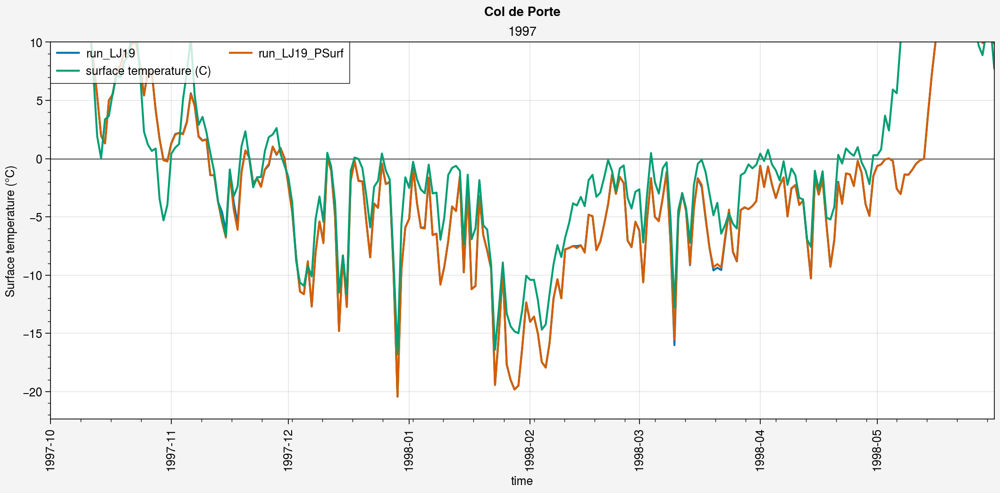

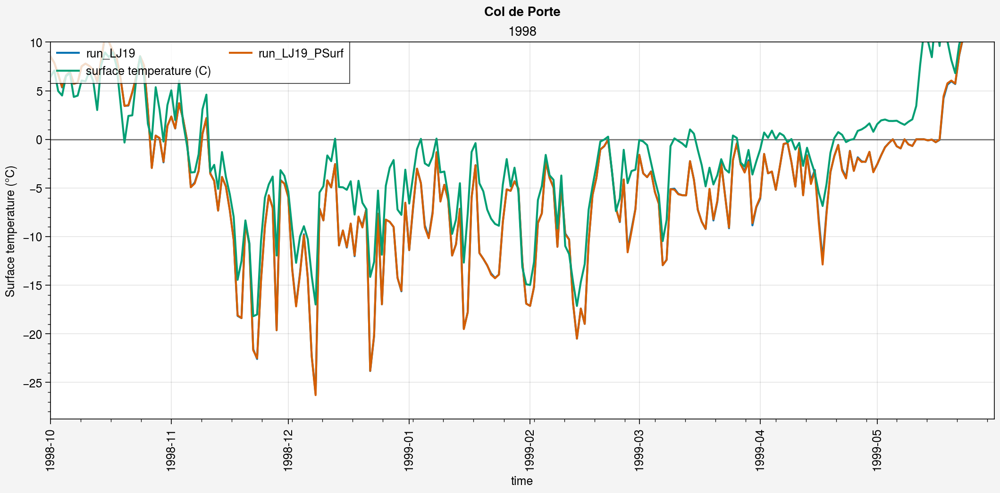

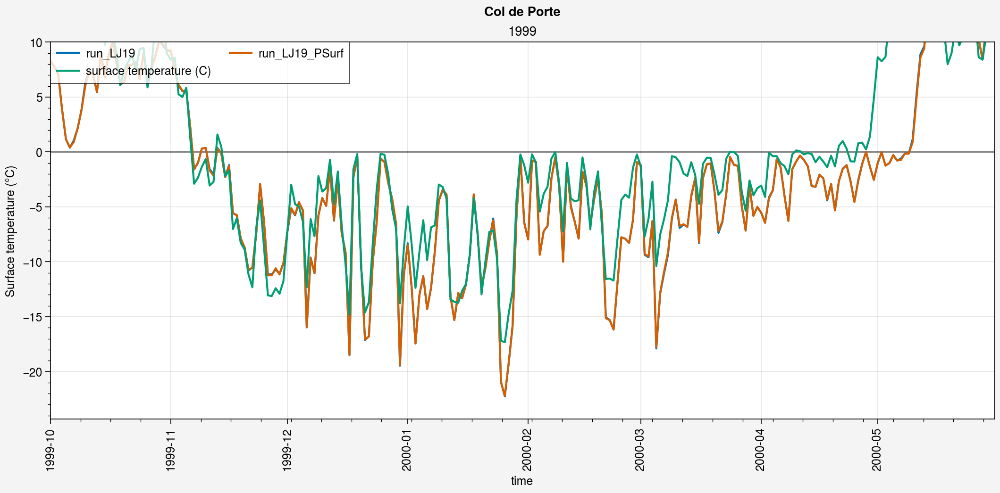

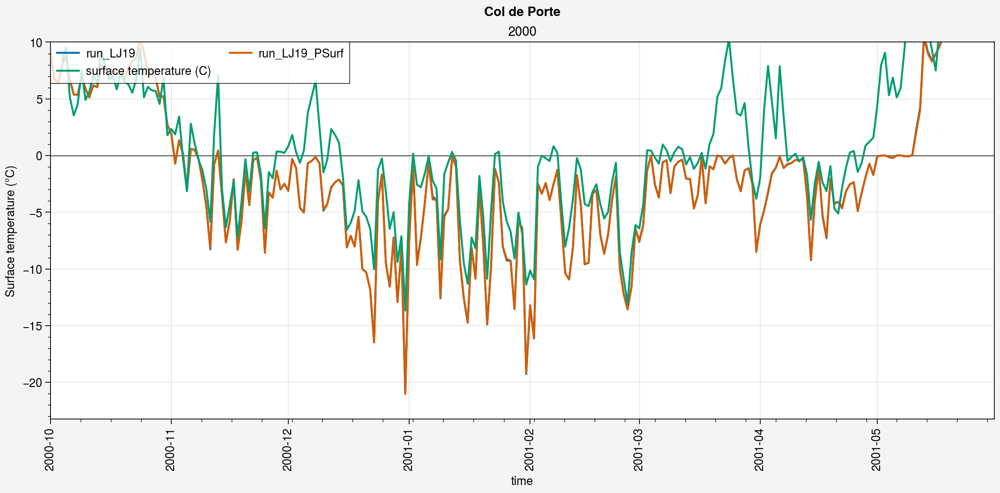

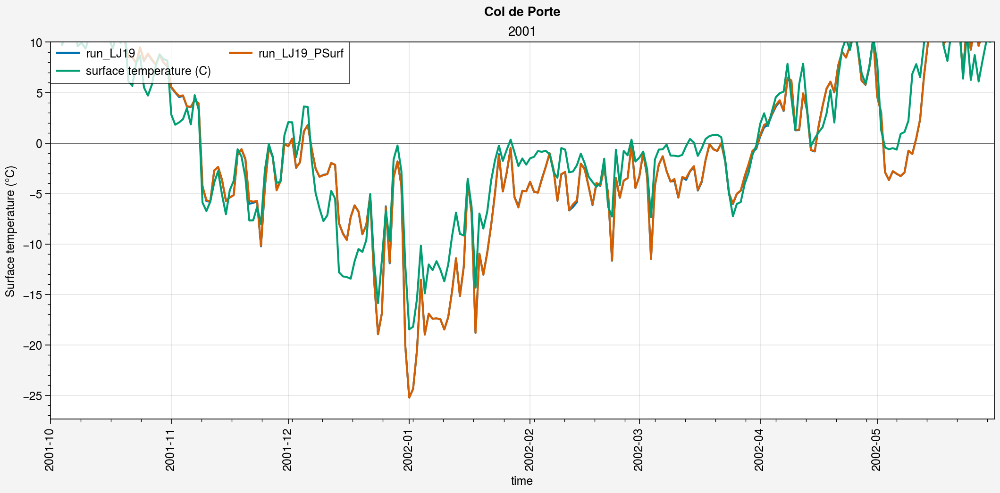

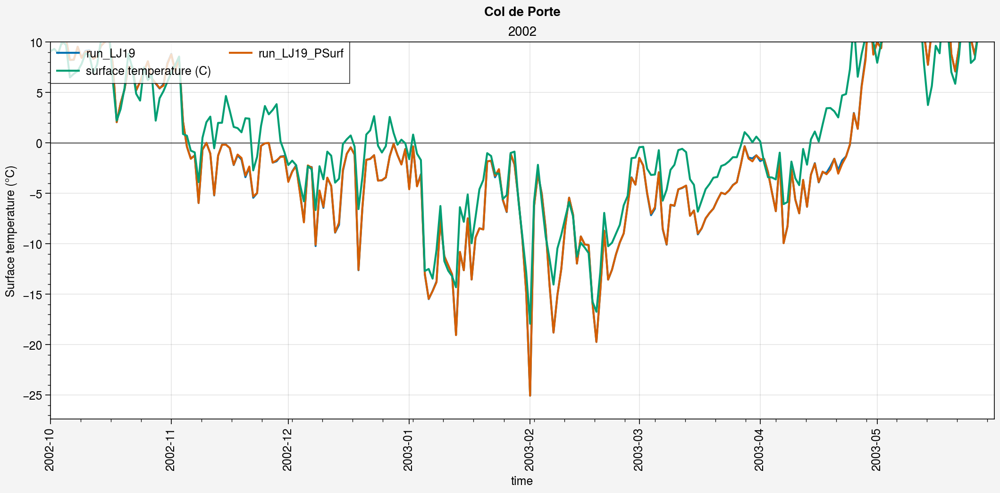

In [9]:
%matplotlib inline
# for year in pplt.arange(1995, 1995):
# for year in pplt.arange(1995, 2012):
for year in pplt.arange(1995, 2002):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(ds_d.ts.sel(time=period).squeeze()-273.15, label=label)
    axs[0].plot(ds2_d.ts.sel(time=period).squeeze()-273.15, label=label2)
    
    # Obs
    axs[0].plot(ds_d_eval_menard2019.ts.sel(time=period))

    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year), ylabel='Surface temperature (°C)', ymax=10)
    
    fig.suptitle('Col de Porte')


### Soil Temperature 10 cm

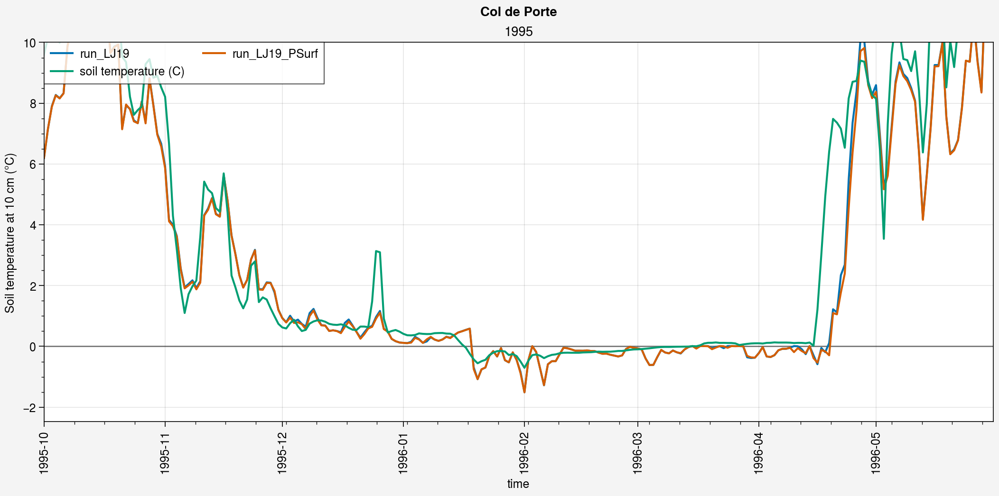

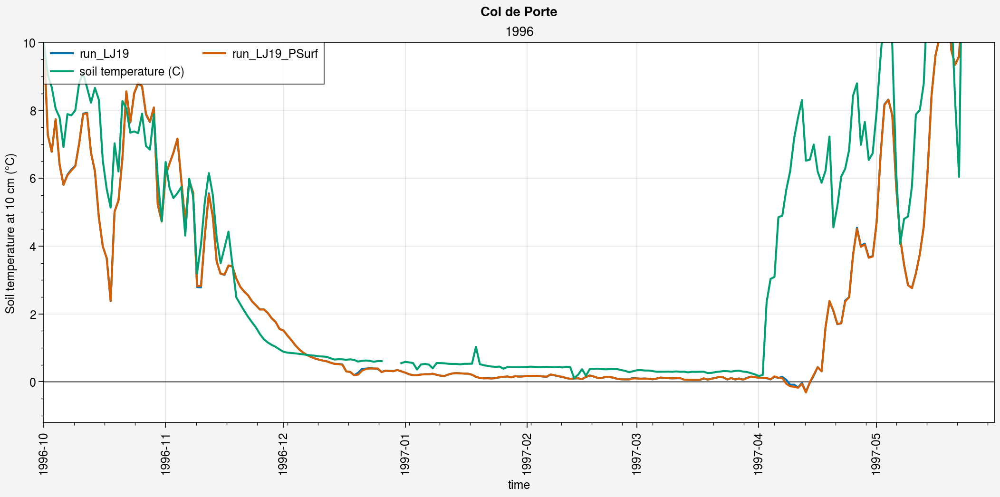

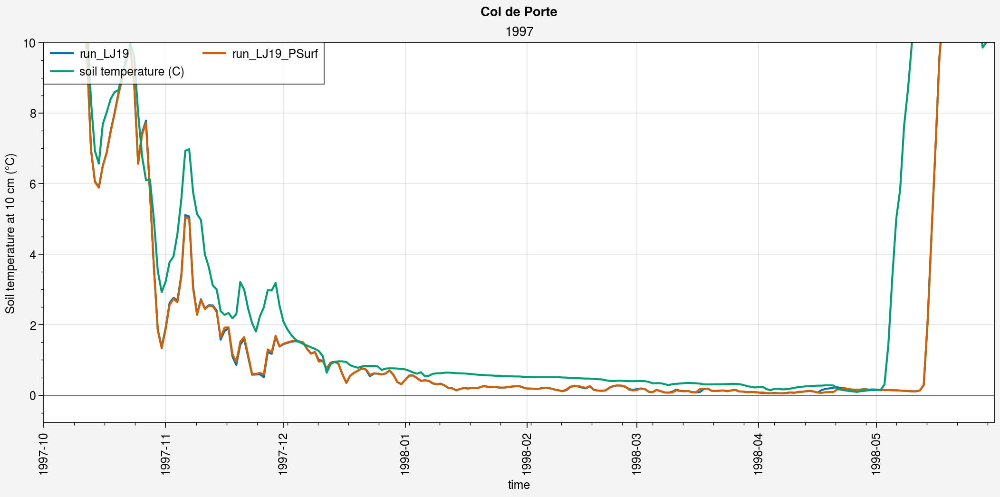

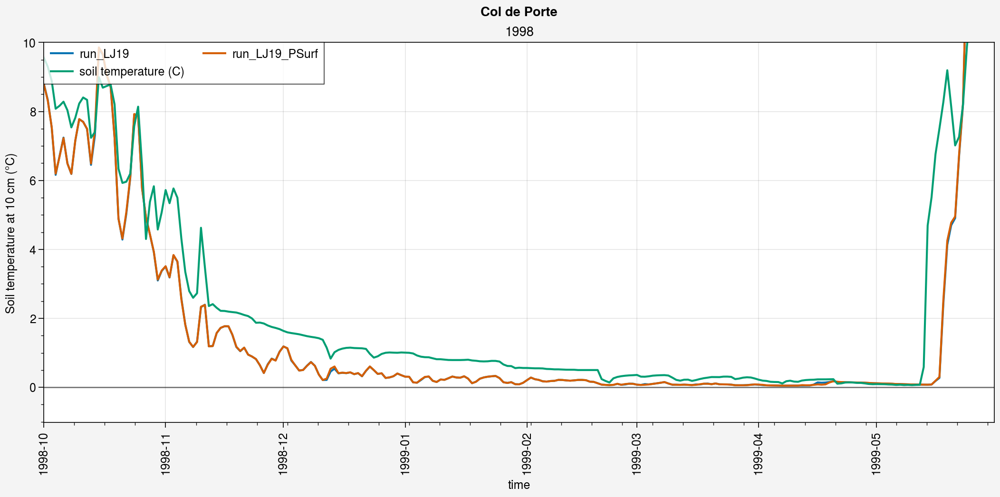

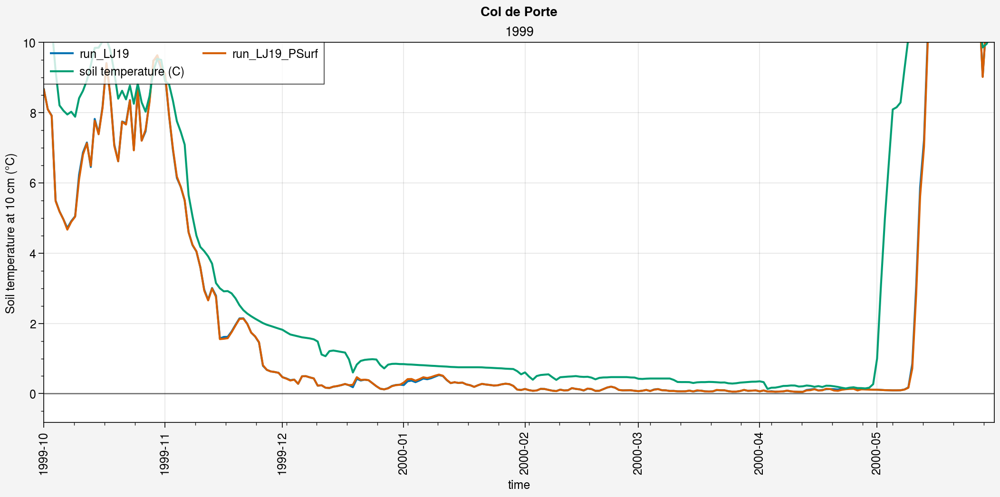

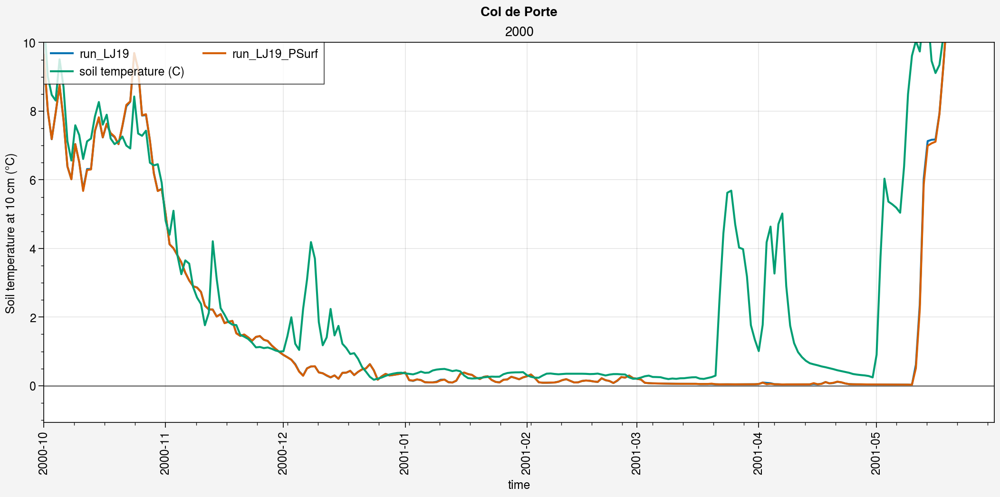

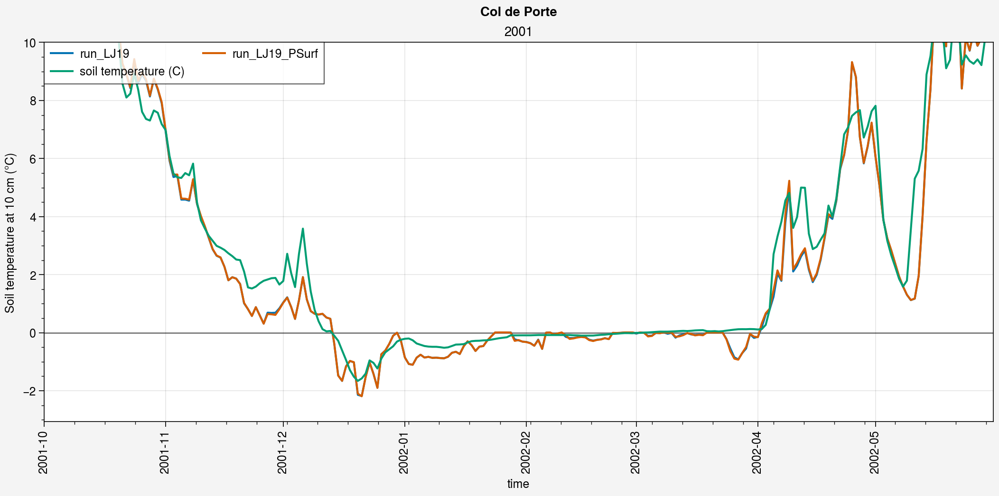

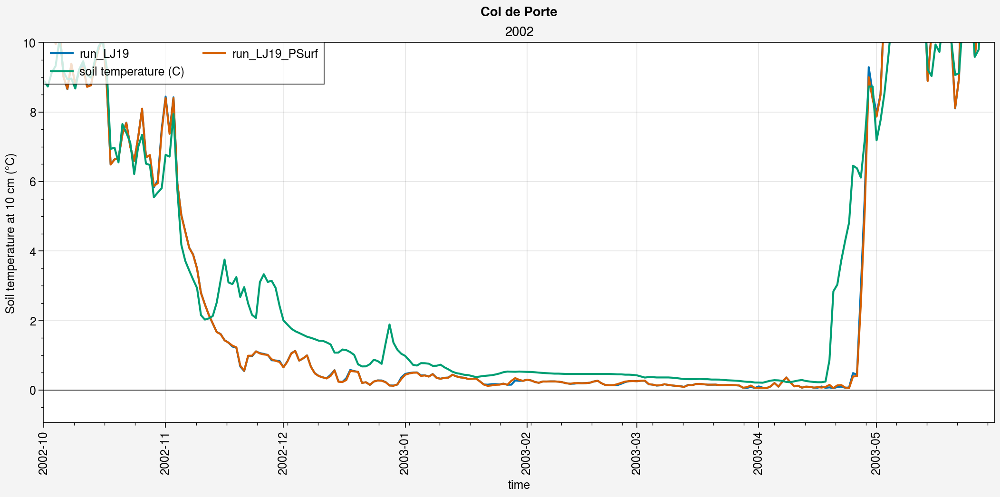

In [10]:
%matplotlib inline
# for year in pplt.arange(1995, 1995):
# for year in pplt.arange(1995, 2012):
for year in pplt.arange(1995, 2002):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2).squeeze()-273.15, label=label)
    axs[0].plot(((ds2_d.tsl.sel(time=period, layer=1)+ds2_d.tsl.sel(time=period, layer=2))/2).squeeze()-273.15, label=label2)
    
    # Obs
    axs[0].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1))

    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year), ylabel='Soil temperature at 10 cm (°C)', ymax=10)
    
    fig.suptitle('Col de Porte')


### Runoff

- `ds_h_eval_lejeune2019['Runoff_1m2']`
- `ds_h_eval_lejeune2019['Runoff_5m2']`

In [ ]:
%matplotlib inline
# for year in pplt.arange(1995, 1995):
for year in pplt.arange(1995, 2012):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(ds_d.mrron.sel(time=period).squeeze()*60*60, label=label)
    axs[0].plot(ds2_d.mrron.sel(time=period).squeeze()*60*60, label=label2)

    # Obs
    axs[0].plot(ds_d_eval_lejeune2019['Runoff_1m2'].sel(time=period).where(
        ds_d_eval_menard2019.snd_auto.sel(time=period) > 0.01), label='Runoff_1m2 (SD > 1cm)')
    axs[0].plot(ds_d_eval_lejeune2019['Runoff_5m2'].sel(time=period).where(
        ds_d_eval_menard2019.snd_auto.sel(time=period) > 0.01), label='Runoff_5m2 (SD > 1cm)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year), ylabel='Runoff (mm h$^{-1}$)')
    
    fig.suptitle('Col de Porte')


## Annual cycles comparison

Text(0.5, 0.98, 'Col de Porte (1995-2007)')

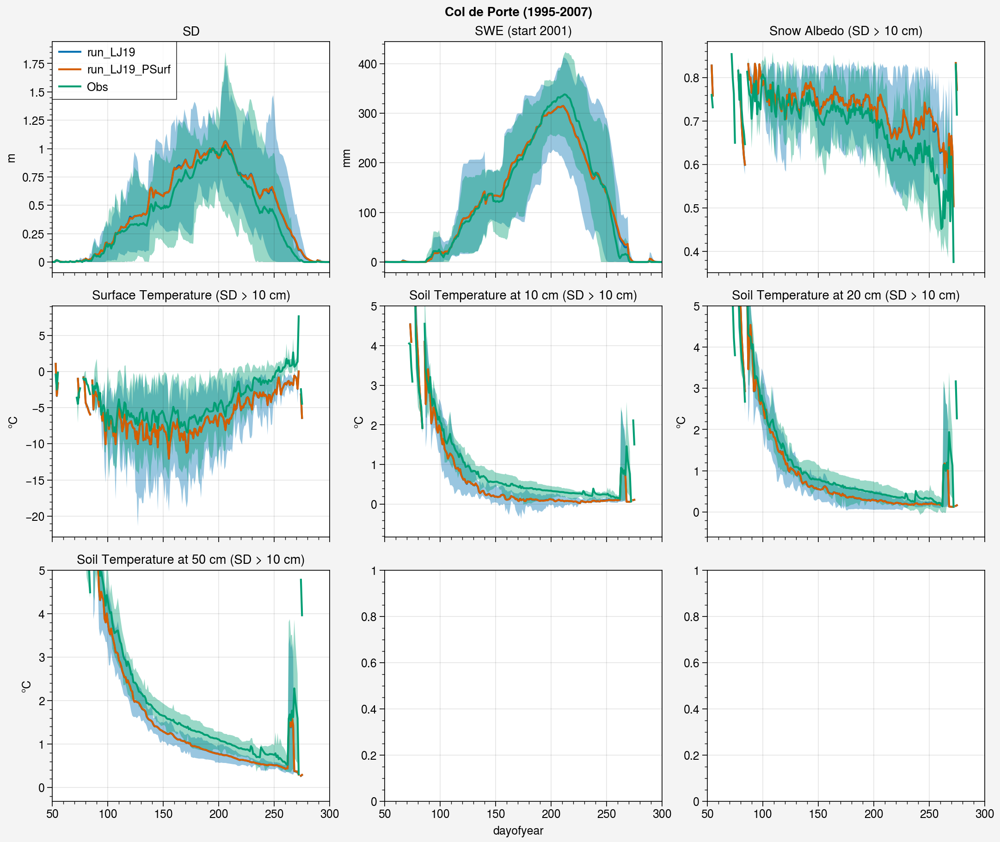

In [11]:
import warnings
warnings.filterwarnings("ignore")

fig, axs = pplt.subplots(ncols=3, nrows=3, refwidth=3, refaspect=1.2, sharey=0)

doy = 140
period = slice('1995', '2007')

ax = axs[0]
mask_obs = ~ds_d_eval_menard2019.snd_auto.sel(time=period).isnull()
shadedata = ds_d.snd.sel(time=period).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
h1 = ax.plot(ds_d.snd.sel(time=period).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata, label=label)
h2 = ax.plot(ds2_d.snd.sel(time=period).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), label=label2)

shadedata = ds_d_eval_menard2019.snd_auto.sel(time=period).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
h3 = ax.plot(ds_d_eval_menard2019.snd_auto.sel(time=period).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata, label='Obs')
ax.format(title='SD', ylabel='m')
ax.legend([h1, h2, h3], loc='ul', ncols=1)


ax = axs[1]
mask_obs = ~ds_d_eval_menard2019.snw_auto.sel(time=period).isnull()
shadedata = ds_d.snw.sel(time=period).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d.snw.sel(time=period).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.plot(ds2_d.snw.sel(time=period).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze())

shadedata = ds_d_eval_menard2019.snw_auto.sel(time=period).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d_eval_menard2019.snw_auto.sel(time=period).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.format(title='SWE (start 2001)', ylabel='mm')


ax = axs[2]
mask_obs = ~ds_d_eval_menard2019.albs.where(ds_d_eval_menard2019.snd_auto > 0.1).isnull()
shadedata = ds_d.albsn.where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d.albsn.where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.plot(ds2_d.albsn.where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze())

shadedata = ds_d_eval_menard2019.albs.where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d_eval_menard2019.albs.where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.format(title='Snow Albedo (SD > 10 cm)', ylabel='')


ax = axs[3]
mask_obs = ~ds_d_eval_menard2019.ts.where(ds_d_eval_menard2019.snd_auto > 0.1).isnull()
shadedata = ds_d.ts.where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')-273.15
ax.plot(ds_d.ts.where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15, shadedata=shadedata)
ax.plot(ds2_d.ts.where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15)

shadedata = ds_d_eval_menard2019.ts.where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d_eval_menard2019.ts.where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.format(title='Surface Temperature (SD > 10 cm)', ylabel='°C')


ax = axs[4]
mask_obs = ~ds_d_eval_menard2019.tsl.sel(sdepth=0.1).where(ds_d_eval_menard2019.snd_auto > 0.1).isnull()
shadedata = ((ds_d.tsl.sel(layer=1)+ds_d.tsl.sel(layer=2))/2).where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')-273.15
ax.plot(((ds_d.tsl.sel(layer=1)+ds_d.tsl.sel(layer=2))/2).where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15, shadedata=shadedata)
ax.plot(((ds2_d.tsl.sel(layer=1)+ds2_d.tsl.sel(layer=2))/2).where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15)

shadedata = ds_d_eval_menard2019.tsl.sel(sdepth=0.1).where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d_eval_menard2019.tsl.sel(sdepth=0.1).where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.format(title='Soil Temperature at 10 cm (SD > 10 cm)', ylabel='°C', ymax=5)


ax = axs[5]
mask_obs = ~ds_d_eval_menard2019.tsl.sel(sdepth=0.2).where(ds_d_eval_menard2019.snd_auto > 0.1).isnull()
shadedata = ((ds_d.tsl.sel(layer=2)+ds_d.tsl.sel(layer=3))/2).where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')-273.15
ax.plot(((ds_d.tsl.sel(layer=2)+ds_d.tsl.sel(layer=3))/2).where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15, shadedata=shadedata)
ax.plot(((ds2_d.tsl.sel(layer=2)+ds2_d.tsl.sel(layer=3))/2).where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15)

shadedata = ds_d_eval_menard2019.tsl.sel(sdepth=0.2).where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d_eval_menard2019.tsl.sel(sdepth=0.2).where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.format(title='Soil Temperature at 20 cm (SD > 10 cm)', ylabel='°C', ymax=5)


ax = axs[6]
mask_obs = ~ds_d_eval_menard2019.tsl.sel(sdepth=0.5).where(ds_d_eval_menard2019.snd_auto > 0.1).isnull()
shadedata = ((ds_d.tsl.sel(layer=5)+ds_d.tsl.sel(layer=6))/2).where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')-273.15
ax.plot(((ds_d.tsl.sel(layer=5)+ds_d.tsl.sel(layer=6))/2).where(ds_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15, shadedata=shadedata)
ax.plot(((ds2_d.tsl.sel(layer=5)+ds2_d.tsl.sel(layer=6))/2).where(ds2_d.snd > 0.1).where(mask_obs).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze()-273.15)

shadedata = ds_d_eval_menard2019.tsl.sel(sdepth=0.5).where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').quantile([0.1, 0.9]).sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze().transpose('quantile', 'dayofyear')
ax.plot(ds_d_eval_menard2019.tsl.sel(sdepth=0.5).where(ds_d_eval_menard2019.snd_auto > 0.1).groupby('time.dayofyear').mean().sel(dayofyear=slice(1,365)).roll(dayofyear=doy).squeeze(), shadedata=shadedata)
ax.format(title='Soil Temperature at 50 cm (SD > 10 cm)', ylabel='°C', ymax=5)


for ax in axs:
    ax.format(xlim=(50,300))

fig.suptitle('Col de Porte ('+period.start+'-'+period.stop+')')




## Time series

In [12]:
def mb(simu, obs):
    return (simu-obs).mean().values.item(0)

def rmb(simu, obs):
    return ((simu-obs).mean()/np.abs(obs.mean())).values.item(0)*100
    
def mab(simu, obs):
    return (np.abs(simu-obs)).mean().values.item(0)

def rmab(simu, obs):
    return ((np.abs(simu-obs)).mean()/np.abs(obs.mean())).values.item(0)*100
    
def rmse(simu, obs):
    return np.sqrt(((simu-obs)**2).mean()).values.item(0)

def rrmse(simu, obs):
    return (np.sqrt(((simu-obs)**2).mean())/np.abs(obs.mean())).values.item(0)*100
    
def corr(simu, obs):
    return xr.corr(simu, obs).values.item(0)

In [13]:
def mb_a(simu, obs):
    return (simu-obs).mean()

def rmb_a(simu, obs):
    return ((simu-obs).mean()/np.abs(obs.mean()))*100
    
def mab_a(simu, obs):
    return (np.abs(simu-obs)).mean()

def rmab_a(simu, obs):
    return ((np.abs(simu-obs)).mean()/np.abs(obs.mean()))*100
    
def rmse_a(simu, obs):
    return np.sqrt(((simu-obs)**2).mean())

def rrmse_a(simu, obs):
    return (np.sqrt(((simu-obs)**2).mean())/np.abs(obs.mean()))*100
    
def corr_a(simu, obs):
    r, _ = stats.pearsonr(simu, obs)
    return r

Text(0.5, 0.98, 'Col de Porte (metrics SD > 10 cm)')

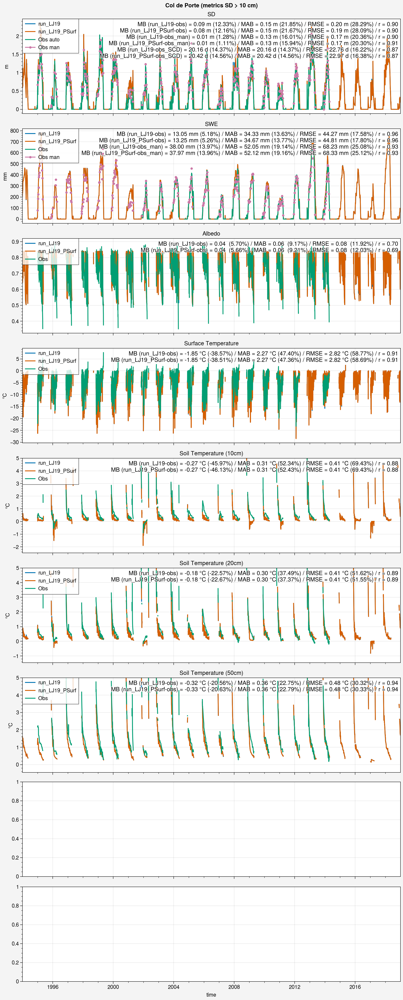

In [14]:
# %matplotlib inline
fig, axs = pplt.subplots(ncols=1, nrows=9, refaspect=4, refwidth=9, sharey=0)

##########
### SD ###
##########

# Plot
ax = axs[0]
h1 = ax.plot(ds_d.snd.squeeze(), label=label)
h2 = ax.plot(ds2_d.snd.squeeze(), label=label2)
h3 = ax.plot(ds_d_eval_menard2019.snd_auto, label='Obs auto')
h4 = ax.plot(ds_d_eval_menard2019.snd_man, label='Obs man', marker='.')

# Metrics
obs = ds_d_eval_menard2019.snd_auto.where(ds_d_eval_menard2019.snd_auto > 0.1)
obs_man = ds_d_eval_menard2019.snd_man.where(ds_d_eval_menard2019.snd_man > 0.1)
simu1 = ds_d.snd.where(ds_d.snd >= 0.1).squeeze()
simu2 = ds2_d.snd.where(ds2_d.snd >= 0.1).squeeze()

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

mb1_man = mb(simu1, obs_man); mb2_man = mb(simu2, obs_man); rmb1_man = rmb(simu1, obs_man); rmb2_man = rmb(simu2, obs_man)
mab1_man = mab(simu1, obs_man); mab2_man = mab(simu2, obs_man); rmab1_man = rmab(simu1, obs_man); rmab2_man = rmab(simu2, obs_man)
rmse1_man = rmse(simu1, obs_man); rmse2_man = rmse(simu2, obs_man); rrmse1_man = rrmse(simu1, obs_man); rrmse2_man = rrmse(simu2, obs_man)
corr1_man = corr(simu1, obs_man); corr2_man = corr(simu2, obs_man)

SCD_obs = []; SCD_ds1 = []; SCD_ds2 = []
for year in pplt.arange(1995, 2013):
    SCD_obs.append(ds_d_eval_menard2019.snd_auto.sel(time=str(year)).where(ds_d_eval_menard2019.snd_auto.sel(time=str(year)) >  0.1).count().values.item(0))
    SCD_ds1.append(ds_d.snd.sel(time=str(year)).where(ds_d.snd.sel(time=str(year)) >  0.1).count().values.item(0))
    SCD_ds2.append(ds2_d.snd.sel(time=str(year)).where(ds2_d.snd.sel(time=str(year)) >  0.1).count().values.item(0))

SCD_obs = np.array(SCD_obs); SCD_ds1 = np.array(SCD_ds1); SCD_ds2 = np.array(SCD_ds2)

mb1_SCD = mb_a(SCD_ds1, SCD_obs); mb2_SCD = mb_a(SCD_ds2, SCD_obs); rmb1_SCD = rmb_a(SCD_ds1, SCD_obs); rmb2_SCD = rmb_a(SCD_ds2, SCD_obs)
mab1_SCD = mab_a(SCD_ds1, SCD_obs); mab2_SCD = mab_a(SCD_ds2, SCD_obs); rmab1_SCD = rmab_a(SCD_ds1, SCD_obs); rmab2_SCD = rmab_a(SCD_ds2, SCD_obs)
rmse1_SCD = rmse_a(SCD_ds1, SCD_obs); rmse2_SCD = rmse_a(SCD_ds2, SCD_obs); rrmse1_SCD = rrmse_a(SCD_ds1, SCD_obs); rrmse2_SCD = rrmse_a(SCD_ds2, SCD_obs)
corr1_SCD = corr_a(SCD_ds1, SCD_obs); corr2_SCD = corr_a(SCD_ds2, SCD_obs)

unit = 'm'
ax.format(title='SD', ylabel=unit, 
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)+'\n'\
                  'MB ('+label+'-obs_man) = {:.2f}'.format(mb1_man)+' '+unit+' ({:.2f}'.format(rmb1_man)+'%) / MAB = {:.2f}'.format(mab1_man)+' '+unit+' '\
          '({:.2f}'.format(rmab1_man)+'%) / RMSE = {:.2f}'.format(rmse1_man)+' '+unit+' ({:.2f}'.format(rrmse1_man)+'%) / r = {:.2f}'.format(corr1_man)+'\n'\
                  'MB ('+label2+'-obs_man) = {:.2f}'.format(mb2_man)+' '+unit+' ({:.2f}'.format(rmb2_man)+'%) / MAB = {:.2f}'.format(mab2_man)+' '+unit+' '\
          '({:.2f}'.format(rmab2_man)+'%) / RMSE = {:.2f}'.format(rmse2_man)+' '+unit+' ({:.2f}'.format(rrmse2_man)+'%) / r = {:.2f}'.format(corr2_man)+'\n'\
                  'MB ('+label+'-obs_SCD) = {:.2f}'.format(mb1_SCD)+' d ({:.2f}'.format(rmb1_SCD)+'%) / MAB = {:.2f}'.format(mab1_SCD)+' d '\
          '({:.2f}'.format(rmab1_SCD)+'%) / RMSE = {:.2f}'.format(rmse1_SCD)+' d ({:.2f}'.format(rrmse1_SCD)+'%) / r = {:.2f}'.format(corr1_SCD)+'\n'\
                  'MB ('+label2+'-obs_SCD) = {:.2f}'.format(mb2_SCD)+' d ({:.2f}'.format(rmb2_SCD)+'%) / MAB = {:.2f}'.format(mab2_SCD)+' d '\
          '({:.2f}'.format(rmab2_SCD)+'%) / RMSE = {:.2f}'.format(rmse2_SCD)+' d ({:.2f}'.format(rrmse2_SCD)+'%) / r = {:.2f}'.format(corr2_SCD)
         )
ax.legend([h1, h2, h3, h4], loc='ul', ncols=1)


###########
### SWE ###
###########

# Plot
ax = axs[1]
h1 = ax.plot(ds_d.snw.squeeze(), label=label)
h2 = ax.plot(ds2_d.snw.squeeze(), label=label2)
h3 = ax.plot(ds_d_eval_menard2019.snw_auto, label='Obs')
h4 = ax.plot(ds_d_eval_menard2019.snw_man, label='Obs man', marker='.')

# Metrics
obs = ds_d_eval_menard2019.snw_auto.where(ds_d_eval_menard2019.snd_auto > 0.1)
obs_man = ds_d_eval_menard2019.snw_man.where(ds_d_eval_menard2019.snd_man > 0.1)
simu1 = ds_d.snw.where(ds_d.snd >= 0.1).squeeze()
simu2 = ds2_d.snw.where(ds2_d.snd >= 0.1).squeeze()

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

mb1_man = mb(simu1, obs_man); mb2_man = mb(simu2, obs_man); rmb1_man = rmb(simu1, obs_man); rmb2_man = rmb(simu2, obs_man)
mab1_man = mab(simu1, obs_man); mab2_man = mab(simu2, obs_man); rmab1_man = rmab(simu1, obs_man); rmab2_man = rmab(simu2, obs_man)
rmse1_man = rmse(simu1, obs_man); rmse2_man = rmse(simu2, obs_man); rrmse1_man = rrmse(simu1, obs_man); rrmse2_man = rrmse(simu2, obs_man)
corr1_man = corr(simu1, obs_man); corr2_man = corr(simu2, obs_man)

unit = 'mm'
ax.format(title='SWE', ylabel=unit, 
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)+'\n'\
                  'MB ('+label+'-obs_man) = {:.2f}'.format(mb1_man)+' '+unit+' ({:.2f}'.format(rmb1_man)+'%) / MAB = {:.2f}'.format(mab1_man)+' '+unit+' '\
          '({:.2f}'.format(rmab1_man)+'%) / RMSE = {:.2f}'.format(rmse1_man)+' '+unit+' ({:.2f}'.format(rrmse1_man)+'%) / r = {:.2f}'.format(corr1_man)+'\n'\
                  'MB ('+label2+'-obs_man) = {:.2f}'.format(mb2_man)+' '+unit+' ({:.2f}'.format(rmb2_man)+'%) / MAB = {:.2f}'.format(mab2_man)+' '+unit+' '\
          '({:.2f}'.format(rmab2_man)+'%) / RMSE = {:.2f}'.format(rmse2_man)+' '+unit+' ({:.2f}'.format(rrmse2_man)+'%) / r = {:.2f}'.format(corr2_man)
         )
ax.legend([h1, h2, h3, h4], loc='ul', ncols=1)


##############
### Albedo ###
##############

# Plot
ax = axs[2]
h1 = ax.plot(ds_d.albsn.where(ds_d.snd >= 0.1).squeeze(), label=label)
h2 = ax.plot(ds2_d.albsn.where(ds2_d.snd >= 0.1).squeeze(), label=label2)
h3 = ax.plot(ds_d_eval_menard2019.albs.where(ds_d_eval_menard2019.snd_auto > 0.1), label='Obs')

# Metrics
obs = ds_d_eval_menard2019.albs.where(ds_d_eval_menard2019.snd_auto > 0.1)
simu1 = ds_d.albsn.where(ds_d.snd >= 0.1).squeeze()
simu2 = ds2_d.albsn.where(ds2_d.snd >= 0.1).squeeze()

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

unit = ''
ax.format(title='Albedo', ylabel=unit, 
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)
         )
ax.legend([h1, h2, h3], loc='ul', ncols=1)



##########
### TS ###
##########

# Plot
ax = axs[3]
h1 = ax.plot(ds_d.ts.where(ds_d.snd >= 0.1).squeeze()-273.15, label=label)
h2 = ax.plot(ds2_d.ts.where(ds2_d.snd >= 0.1).squeeze()-273.15, label=label2)
h3 = ax.plot(ds_d_eval_menard2019.ts.where(ds_d_eval_menard2019.snd_auto > 0.1), label='Obs')

# Metrics
obs = ds_d_eval_menard2019.ts.where(ds_d_eval_menard2019.snd_auto > 0.1)
simu1 = ds_d.ts.where(ds_d.snd >= 0.1).squeeze()-273.15
simu2 = ds2_d.ts.where(ds2_d.snd >= 0.1).squeeze()-273.15

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

unit = '°C'
ax.format(title='Surface Temperature', ylabel=unit, 
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)
         )
ax.legend([h1, h2, h3], loc='ul', ncols=1)



###########
### TSL ###
###########

### 10 cm
# Plot
ax = axs[4]
h1 = ax.plot(((ds_d.tsl.sel(layer=1)+ds_d.tsl.sel(layer=2))/2).where(ds_d.snd > 0.1).squeeze()-273.15, label=label)
h2 = ax.plot(((ds2_d.tsl.sel(layer=1)+ds2_d.tsl.sel(layer=2))/2).where(ds2_d.snd > 0.1).squeeze()-273.15, label=label2)
h3 = ax.plot(ds_d_eval_menard2019.tsl.sel(sdepth=0.1).where(ds_d_eval_menard2019.snd_auto > 0.1), label='Obs')

# Metrics
obs = ds_d_eval_menard2019.tsl.sel(sdepth=0.1).where(ds_d_eval_menard2019.snd_auto > 0.1)
simu1 = ((ds_d.tsl.sel(layer=1)+ds_d.tsl.sel(layer=2))/2).where(ds_d.snd > 0.1).squeeze()-273.15
simu2 = ((ds2_d.tsl.sel(layer=1)+ds2_d.tsl.sel(layer=2))/2).where(ds2_d.snd > 0.1).squeeze()-273.15

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

unit = '°C'
ax.format(title='Soil Temperature (10cm)', ylabel=unit, ymax=5,
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)
         )
ax.legend([h1, h2, h3], loc='ul', ncols=1)


### 20 cm
# Plot
ax = axs[5]
h1 = ax.plot(((ds_d.tsl.sel(layer=2)+ds_d.tsl.sel(layer=3))/2).where(ds_d.snd > 0.1).squeeze()-273.15, label=label)
h2 = ax.plot(((ds2_d.tsl.sel(layer=2)+ds2_d.tsl.sel(layer=3))/2).where(ds2_d.snd > 0.1).squeeze()-273.15, label=label2)
h3 = ax.plot(ds_d_eval_menard2019.tsl.sel(sdepth=0.2).where(ds_d_eval_menard2019.snd_auto > 0.1), label='Obs')

# Metrics
obs = ds_d_eval_menard2019.tsl.sel(sdepth=0.2).where(ds_d_eval_menard2019.snd_auto > 0.1)
simu1 = ((ds_d.tsl.sel(layer=2)+ds_d.tsl.sel(layer=3))/2).where(ds_d.snd > 0.1).squeeze()-273.15
simu2 = ((ds2_d.tsl.sel(layer=2)+ds2_d.tsl.sel(layer=3))/2).where(ds2_d.snd > 0.1).squeeze()-273.15

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

unit = '°C'
ax.format(title='Soil Temperature (20cm)', ylabel=unit, ymax=5,
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)
         )
ax.legend([h1, h2, h3], loc='ul', ncols=1)



### 50 cm
# Plot
ax = axs[6]
h1 = ax.plot(((ds_d.tsl.sel(layer=5)+ds_d.tsl.sel(layer=6))/2).where(ds_d.snd > 0.1).squeeze()-273.15, label=label)
h2 = ax.plot(((ds2_d.tsl.sel(layer=5)+ds2_d.tsl.sel(layer=6))/2).where(ds2_d.snd > 0.1).squeeze()-273.15, label=label2)
h3 = ax.plot(ds_d_eval_menard2019.tsl.sel(sdepth=0.5).where(ds_d_eval_menard2019.snd_auto > 0.1), label='Obs')

# Metrics
obs = ds_d_eval_menard2019.tsl.sel(sdepth=0.5).where(ds_d_eval_menard2019.snd_auto > 0.1)
simu1 = ((ds_d.tsl.sel(layer=5)+ds_d.tsl.sel(layer=6))/2).where(ds_d.snd > 0.1).squeeze()-273.15
simu2 = ((ds2_d.tsl.sel(layer=5)+ds2_d.tsl.sel(layer=6))/2).where(ds2_d.snd > 0.1).squeeze()-273.15

mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

unit = '°C'
ax.format(title='Soil Temperature (50cm)', ylabel=unit, ymax=5,
          urtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
          '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
                  'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
          '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)
         )
ax.legend([h1, h2, h3], loc='ul', ncols=1)


# ##############
# ### Runoff ###
# ##############

# # Plot
# ax = axs[7]
# h1 = ax.plot(ds_d.mrron.squeeze()*60*60, label=label)
# h2 = ax.plot(ds2_d.mrron.squeeze()*60*60, label=label2)
# h3 = ax.plot(ds_d_eval_lejeune2019['Runoff_1m2'], label='Obs 1m2')
# h4 = ax.plot(ds_d_eval_lejeune2019['Runoff_5m2'], label='Obs 5m2')

# # Metrics
# obs = ds_d_eval_lejeune2019['Runoff_1m2'].where(ds_d_eval_menard2019.snd_auto > 0.1)
# obs_2 = ds_d_eval_lejeune2019['Runoff_5m2'].where(ds_d_eval_menard2019.snd_auto > 0.1)
# simu1 = ds_d.mrron.where(ds_d.snd >= 0.1).squeeze()*60*60
# simu2 = ds2_d.mrron.where(ds2_d.snd >= 0.1).squeeze()*60*60

# mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
# mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
# rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
# corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

# mb1_2 = mb(simu1, obs_2); mb2_2 = mb(simu2, obs_2); rmb1_2 = rmb(simu1, obs_2); rmb2_2 = rmb(simu2, obs_2)
# mab1_2 = mab(simu1, obs_2); mab2_2 = mab(simu2, obs_2); rmab1_2 = rmab(simu1, obs_2); rmab2_2 = rmab(simu2, obs_2)
# rmse1_2 = rmse(simu1, obs_2); rmse2_2 = rmse(simu2, obs_2); rrmse1_2 = rrmse(simu1, obs_2); rrmse2_2 = rrmse(simu2, obs_2)
# corr1_2 = corr(simu1, obs_2); corr2_2 = corr(simu2, obs_2)

# unit = 'mm h$^{-1}$'
# ax.format(title='Runoff (from snowpack)', ylabel=unit, 
#           urtitle='MB ('+label+'-obs_1m2) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
#           '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
#                   'MB ('+label2+'-obs_1m2) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
#           '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)+'\n'\
#                   'MB ('+label+'-obs_5m2) = {:.2f}'.format(mb1_2)+' '+unit+' ({:.2f}'.format(rmb1_2)+'%) / MAB = {:.2f}'.format(mab1_2)+' '+unit+' '\
#           '({:.2f}'.format(rmab1_2)+'%) / RMSE = {:.2f}'.format(rmse1_2)+' '+unit+' ({:.2f}'.format(rrmse1_2)+'%) / r = {:.2f}'.format(corr1_2)+'\n'\
#                   'MB ('+label2+'-obs_5m2) = {:.2f}'.format(mb2_2)+' '+unit+' ({:.2f}'.format(rmb2_man)+'%) / MAB = {:.2f}'.format(mab2_2)+' '+unit+' '\
#           '({:.2f}'.format(rmab2_2)+'%) / RMSE = {:.2f}'.format(rmse2_2)+' '+unit+' ({:.2f}'.format(rrmse2_2)+'%) / r = {:.2f}'.format(corr2_2)
#          )
# ax.legend([h1, h2, h3, h4], loc='ul', ncols=1)


# ###########
# ### tsn ###
# ###########

# # Plot
# ax = axs[8]
# h1 = ax.plot(ds_hh.tsn.resample(time='D').mean().squeeze().where(ds_d.snd > 0.1), label=label)
# h2 = ax.plot(ds2_hh.tsn.resample(time='D').mean().squeeze().where(ds2_d.snd > 0.1), label=label2)
# h3 = ax.plot(ds_tsn.tsn, label='Obs', marker='.')

# # Metrics
# obs = ds_tsn.tsn; simu1 = ds_hh.tsn; simu2 = ds2_hh.tsn

# mb1 = mb(simu1, obs); mb2 = mb(simu2, obs); rmb1 = rmb(simu1, obs); rmb2 = rmb(simu2, obs)
# mab1 = mab(simu1, obs); mab2 = mab(simu2, obs); rmab1 = rmab(simu1, obs); rmab2 = rmab(simu2, obs)
# rmse1 = rmse(simu1, obs); rmse2 = rmse(simu2, obs); rrmse1 = rrmse(simu1, obs); rrmse2 = rrmse(simu2, obs)
# corr1 = corr(simu1, obs); corr2 = corr(simu2, obs)

# unit = '°C'
# ax.format(title='Snowpack temperature', ylabel=unit, ymin=-8,
#           lrtitle='MB ('+label+'-obs) = {:.2f}'.format(mb1)+' '+unit+' ({:.2f}'.format(rmb1)+'%) / MAB = {:.2f}'.format(mab1)+' '+unit+' '\
#           '({:.2f}'.format(rmab1)+'%) / RMSE = {:.2f}'.format(rmse1)+' '+unit+' ({:.2f}'.format(rrmse1)+'%) / r = {:.2f}'.format(corr1)+'\n'\
#                   'MB ('+label2+'-obs) = {:.2f}'.format(mb2)+' '+unit+' ({:.2f}'.format(rmb2)+'%) / MAB = {:.2f}'.format(mab2)+' '+unit+' '\
#           '({:.2f}'.format(rmab2)+'%) / RMSE = {:.2f}'.format(rmse2)+' '+unit+' ({:.2f}'.format(rrmse2)+'%) / r = {:.2f}'.format(corr2)
#          )
# ax.legend([h1, h2, h3], loc='ul', ncols=1)


fig.suptitle('Col de Porte (metrics SD > 10 cm)')
# fig.save('test.jpg')